## Trabajo de desarrollo: robot omnireccional basado en Robomaster EP

### Material accesorio

Los siguientes videos complementan las imágenes estáticas en las secciones siguientes:

- Modelo simulado: https://youtu.be/n6w3obZQTlI
- Datos capturados en el robot: https://youtu.be/NZOmnsyIOQw
- Sintonización de navegación en simulación: https://youtu.be/ByZnu_KiW20
- Robot teleoperado: https://youtube.com/shorts/acVy0DS68EI

### Introducción

Este trabajo que viene siendo realizado desde hace varios meses y continúa en curso consiste en la creación de un robot omnidireccional utilizando como plataforma el robot [Robomaster EP de DJI](https://www.dji.com/global/robomaster-ep).

El robot Robomaster EP es un robot educativo que se utiliza en competencias de robótica y programación. Este robot cuenta con un chasis de cuatro ruedas mecanum, lo que le permite moverse en cualquier dirección sin necesidad de girar. Además, cuenta con una serie de sensores y actuadores que permiten al usuario interactuar con el robot de diversas maneras.

Cuenta también con un manipulador simple, con movimiento en dos dimensiones, que permite al robot recoger y soltar objetos pequeños.

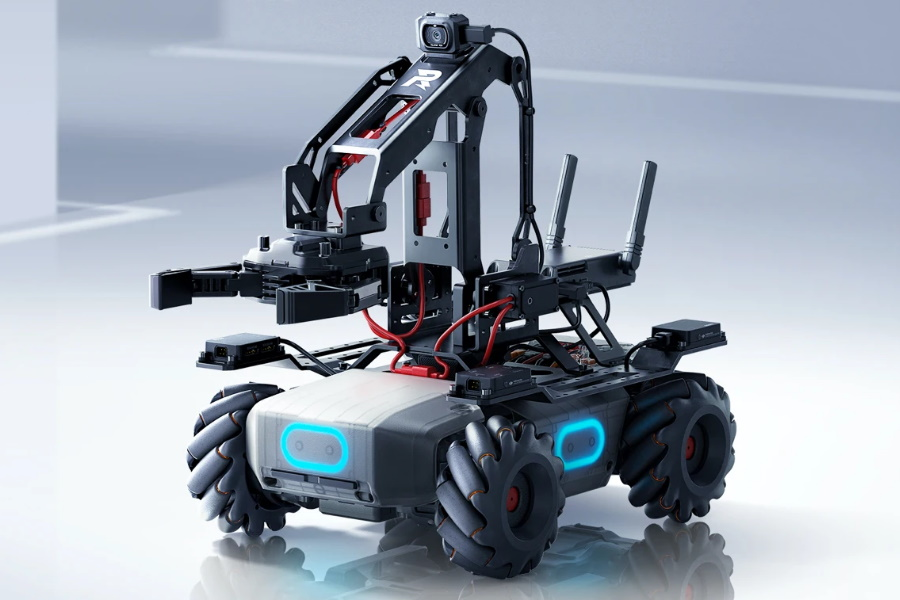

El Robomaster EP es un robot muy versátil, con muchas posibilidades de programación y personalización, contando con interfaces diversas (wifi, USB, UART) que permiten la conexión con otros dispositivos como computadoras arduino, raspberry pi, etc. [Una API en Python muy completa y bien documentada](https://robomaster-dev.readthedocs.io/en/latest/) permite al usuario interactuar con el robot de manera sencilla, comandando actuadores y realizando lectura de sensores.

Debe notarse que el Robomaster EP está diseñado primordialmente para ser teleoperado mediante una App en un dispositivo móvil, por lo que no dispone de sensores de navegación autónoma como cámara de profudidad, lidar, etc.

### Objetivo

El objectivo de este projecto es la creación de un robot experimental con capacidades de navegación autónoma utilizando el Robomaster EP como plataforma base y con la adición de una serie de sensores y de una unidad de cómputo y almacenamiento de a bordo.

Esto permitirá contar con una plataforma de pruebas y entrenamiento, además de permitir la adquisición de datos y su almacenamiento en bagfiles en tiempo real.

El trabajo incluye tanto la integración de hardware, hardware-software y simulación del robot en Gazebo.



### Selección de hardware

Para la sensorización del robot se seleccionaron una cámara de profundidad [Intel RealSense D435i](https://www.intelrealsense.com/depth-camera-d435i/) y un lidar [RPLidar A2M12](https://www.slamtec.com/en/Lidar/a2). Ambos dispositivos son de fácil integración con ROS y cuentan con drivers y paquetes de software que permiten su utilización de manera sencilla.

La cámara de profunidad cuenta con una IMU integrada que puede ser integrada en la navegación del robot en etapas posteriores.

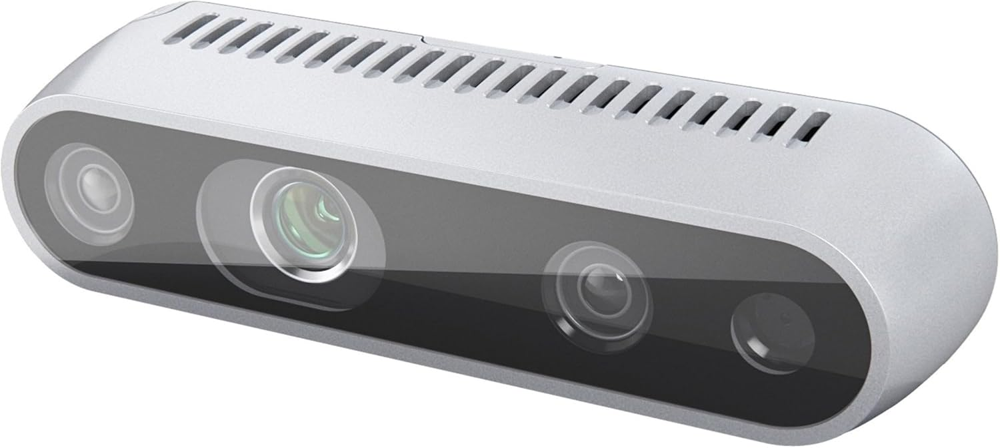

El lidar RPLidar A2M12 es un lidar de bajo costo que cuenta con un rango de detección de 12 metros y un campo de visión de 360 grados. Es un dispositivo de bajo perfil, lo que simplifica su instalación en el escaso espacio disponible en el robot.

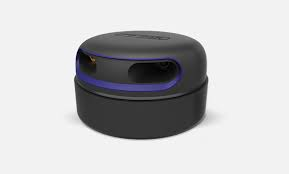

La únidad de cómputo de a bordo seleccionada fue una [Raspberry Pi 5](https://www.raspberrypi.com/products/raspberry-pi-5/), que cuenta con la posilibidad de instalar una unidad de almacenamiento de alta velocidad NVME que permitirá la captura de bagfiles de alta calidad en tiempo real. Se consideraron alternativas, como la utilización de una Jetson Nano, pero se optó por la Raspberry Pi 5 por su bajo costo, tamaño y consumo energético, ya que el robot cuenta con una batería de limitada capacidad (autonomía estimada de alrededor de una hora y media) que no puede ser reemplazada por una de mayor capacidad.



### Integración del Robomaster EP con ROS

Si bien no existe conectividad directa entre el Robomaster EP con sistemas basados en ROS, existen varios drivers no oficiales que permiten actuar como intermediarios entre el robot y un sistema ROS. For instance:

- Jeguzzy's [Robomaster ROS](https://github.com/jeguzzi/robomaster_ros)
- qiayuanl's [EP-ROS](https://github.com/qiayuanl/EP-ROS)

Robomaster ROS es probablemente el [mejor documentado](https://jeguzzi.github.io/robomaster_ros/getting_started.html) y más funcional, habiendo sido desarrollado como parte de un proyecto [Horizon 2020](https://github.com/jeguzzi/robomaster_ros?tab=readme-ov-file#thanks) de la Unión Europea, y es por esta razón el utilizado en este trabajo.

Robomaster ROS es un paquete de ROS que permite la comunicación entre un robot Robomaster EP y un sistema ROS. Este paquete incluye nodos que permiten la lectura y escritura de datos en el robot, así como la publicación de datos de sensores y actuadores en ROS.

Puede comunicarse a traves de USB o WiFi, y permite el control de los motores, el manipulador, la cámara, y otros actuadores del robot, utilizando para ello la API python provista por DJI.

El paquete actúa como intermediario entre el robot y ROS, pero no provee ningún tipo de capacidad de planificación o control. Es decir, no es un paquete de navegación, sino un controlador de hardware. Las capacidaddes más relevantes de este paquete son:

- Controlar la velocidad del vehículo mediante comandos de *twist*, típicos de ROS.
- Publicar en ROS la odometría calculada internamente por el firmaware del robot, que incluye tanto ruedas como datos de una IMU interna.
- Publicar en ROS imágenes de la cámara del robot en un tópico de ROS.
- Controlar el manipulador, tomando como entrada las coordenadas `x` y `z` del objetivo y encargándose del cálculo cinemático y control de los servos del manipulador.
- Controlar el estado del gripper del manipulador.
- Leer otros sensores del robot, como el sensor de distancia infrarrojo, sensores de impacto, etc.


### Simulación en Gazebo

El primer paso de desarrollo consistió en la creación de un modelo de simulación en [Gazebo Sim](https://gazebosim.org/home) del robot Robomaster EP que permitiera ensayar diversos aspectos de autonomía antes de que el hardware estuviera disponible.

El paquete Robomaster ROS no incluye ningún modelo de simulación, pero sí un incluye un modelo URDF muy completo del hardware del robot que fue utilizado para la creación del modelo de simulación.

El modelo original no tenía un modelo de fricción adecuado en las ruedas mecanum. El modelo de colisión de las ruedas fue simplificado para ser representado por una forma geométrica simple (un cilindro casi chato), que permite una simulación muy más eficiente y estable. El modelo de fricción fue ajustado para simular la cinética de las ruedas mecanum, [modelando la fricción en las ruedas como direccional](https://github.com/glpuga/robomaster_ros/blob/donatello_patches/robomaster_description/urdf/wheel.urdf.xacro#L44), con vector de dirección dependiente de la posición de la rueda en el robot.

El modelo tampoco contaba con modelos adecuados para cargar drivers adecuados para el controlador en Gazebo del driver mecanum, por lo que fue agregado. El plugin correspondiente en Gazebo Sim no está completo aún, siendo incapaz de publicar los datos de odometría de las ruedas. Por esta razón fue necesario [parchar el código del plugin](https://github.com/glpuga/gz-sim/commit/f676237824a5c94b8c51c9c293728cc83b6cf7cd) para que pudiera publicar estos datos.

Se agregaron además visuales para la cámara de profunidad, el lidar y el deck de soporte de la Raspberry Pi, que no estaban presentes en el modelo original. Se agregaron también los plugins correspondientes a la cámara de profundidad y el lidar, para que la simulación de gazebo simule los sensores correspondientes en las poses correctas dentro del marco del robot.

El manipulador del Robomaster EP tiene una mecánica muy sencilla, pero basada en cadenas paralelas que no pueden ser simuladas en Gazebo Sim (o cualquier otra versión de Gazebo). Esta mecánica se utiliza para mover el manipulador de forma tal que el gripper siempre se desplace de forma paralela al piso. Dado que el foco del proyectdo estaba en la autonomía de navegación, y no en la utilización del manipulador, se decidió evadir temporariamente este problema modificando el modelo URDF para que en simulación no tenga ningún tipo de movimiento (es puramente visual).

Para el mundo de simulación se utilizó una versión adaptada del ["AWS Bookstore World"](https://github.com/aws-robotics/aws-robomaker-bookstore-world) que se encuentra disponible públicamente. Las únicas modificaciones realizadas (algunas propias y otras tomadas de la comunidad) fueron la adaptación del mundo para que funcione con Gazebo Sim (el original es para Gazebo Classic).

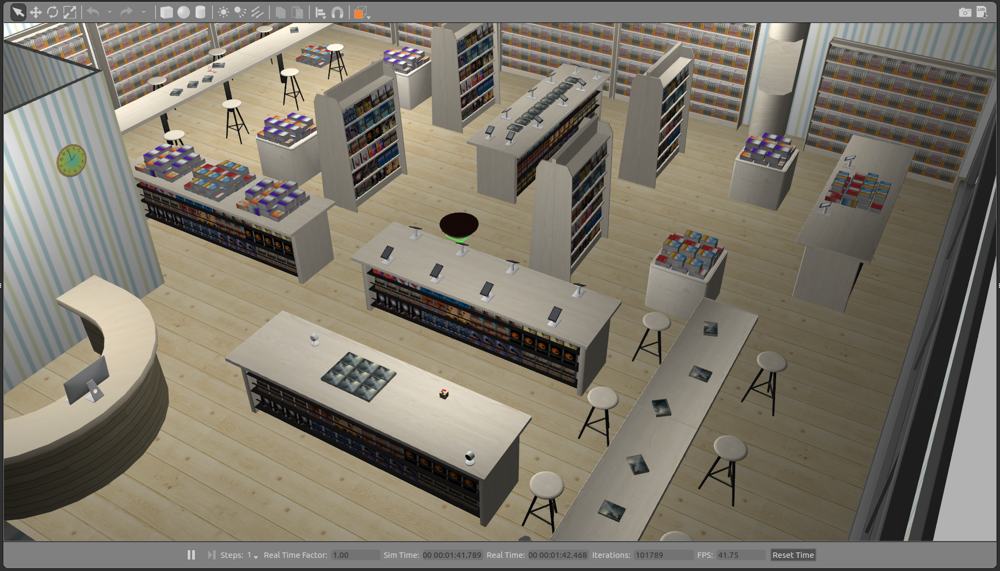

El resultado es este modelo de simulación del robot:

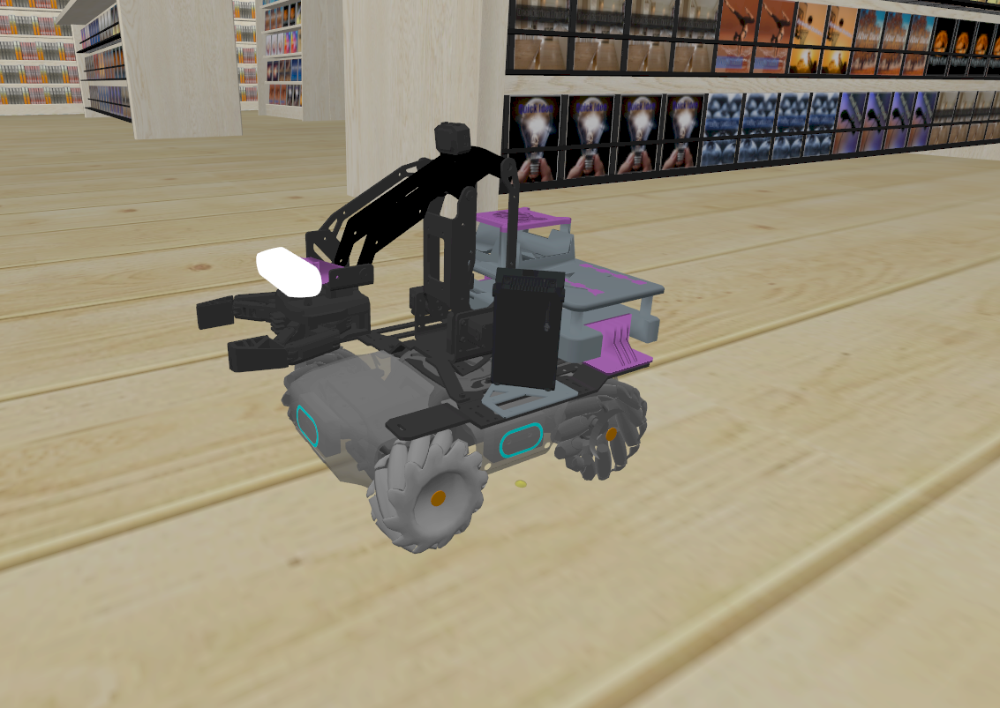


### Integración del hardware

La integración del hardware consistió en la instalación de la cámara de profunidad, el lidar y las computadora de bordo, y la resolución del los problemas de integración de estos dispositivos con el robot.

Para la integración se diseñaron y fabricaron mediante impresión 3D varias piezas y suportes que se montaron en el robot utilizando los orificios y soportes originales que la estructura del mismo robot provee para la instalación de extensiones.

Un cable de adaptación especial debió ser confeccionado para poder alimentar la Raspberry Pi con la batería del robot. La Raspberry Pi a su vez provee la alimentación a la cámara de profunidad y al lidar a través de USB. 

La conexión entre la Raspberry Pi y el controlador del robot estaba planeada para realizarse utilizando el canal USB provisto para ello en el controlador. En la práctica, sin embargo, esta conexión resultó ser extremadamente inestable y se optó por utilizar la conexión WiFi para la comunicación entre la Raspberry Pi y el controlador del robot en lugar de ello.

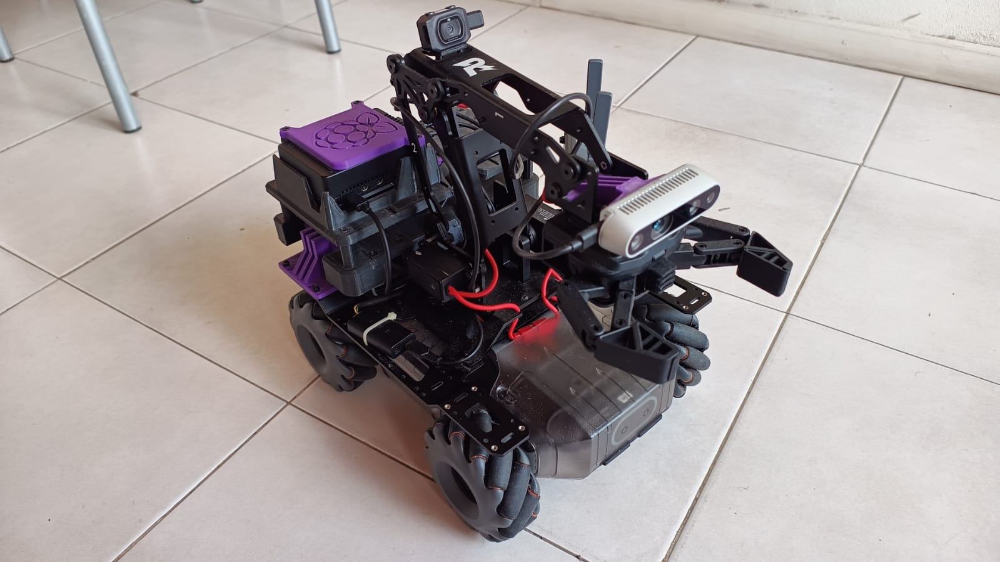


### Stack the software

Ya con el hardware integrado, se procedió a la integración del software. El stack de software consiste en los siguientes componentes principales:

- **Robomaster ROS**: El controlador de hardware del robot, que permite la comunicación entre el robot y ROS.
- **Realsense camera driver**: El driver de la cámara de profunidad.
- **RPLidar driver**: El driver del lidar.
- **Navigation stack**: El stack de navegación de ROS, que incluye la planificación, localización, evasión de obstáculos, etc.
- **Teleoperación**: Un nodo que permite la teleoperación del robot utilizando el teclado.

Los sensores (cámara de profundidad y lidar) se probaron mediante la adquisición de datos a bordo de la Raspberry Pi, y se verificó que los datos se publicaban correctamente en ROS.

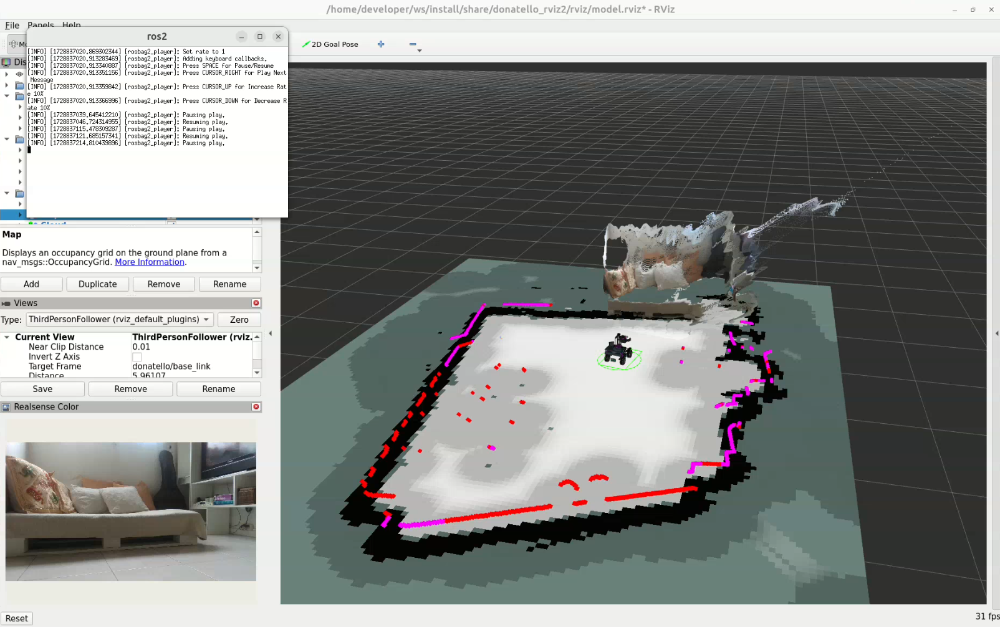

El stack de localización y planificación se sintonizó en simulación. El robot real tiene una zona muerta considerable en el control de ruedas, con velocidades mínimas de 0.1 m/s para la velocidad lineal y 0.2 rad/s para la velocidad angular. Esto requirió experimentación para encontrar una configuración adecuada para el controlador de navegación (*local planner*).

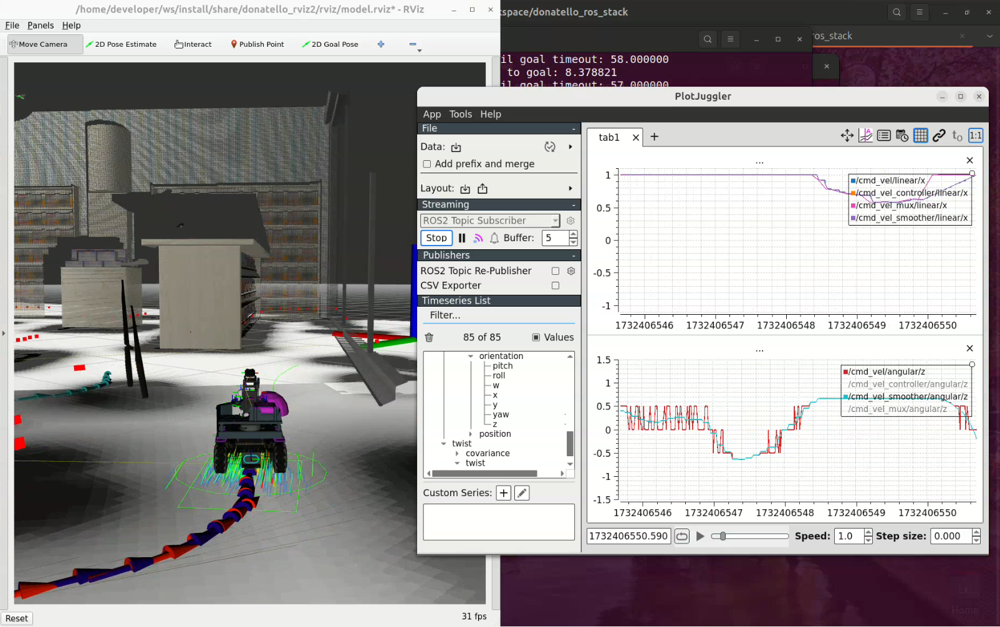

La capacidad de cómputo de la Raspberry Pi 5 es limitada, por lo luego de varios ensayos se descartó la utilización de controladores locales basados en MPC, como MPPI, optando en su lugar por controladores geométricos (Pure Pursuit) que requieren menos cómputo y pueden ser ejecutados a una tasa mucho más alta para compensar la limitaciones de actuación de ruedas.

Para el planner global se está ensayando un planificador global kinemático basado en A* que permite la planificación de trayectorias en un entorno 2D considerando la pisada no circular del robot.

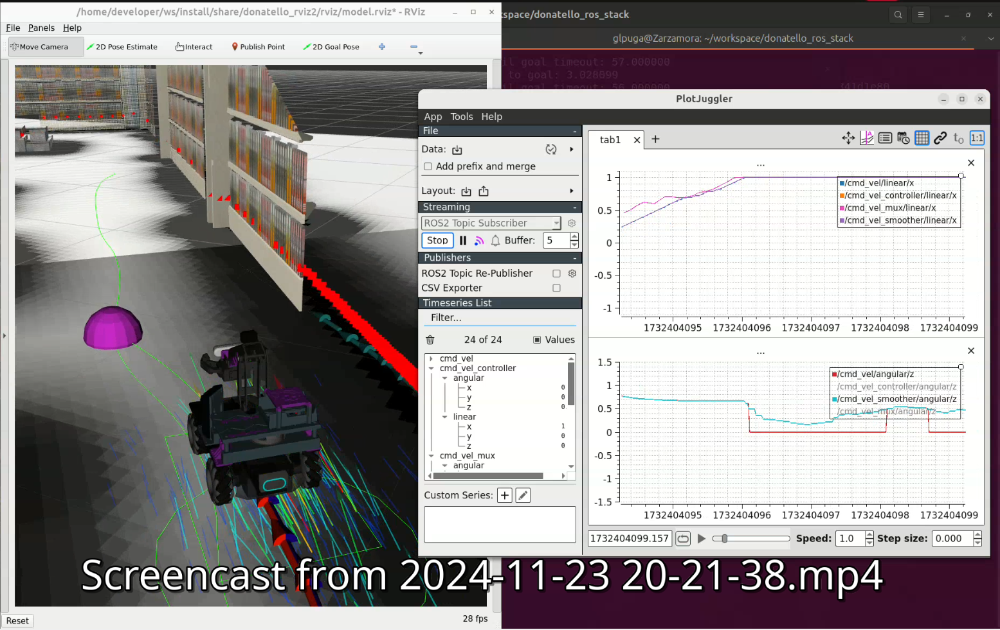

### Estado actual del proyecto y próximos pasos

Actualmente el proyecto continua en desarrollo. El problema más inmediato a resolver es la alta demanda de capacidad de cómputo que implica correr RViz a bordo de la Raspberry Pi, lo que limita la interactividad y la capacidad de procesar las nubes de puntos de la cámara de profundidad en tiempo real.

Dado que RViz sólamente se utiliza para visualización y generación de metas de navegación, se están analizando alternativas para reducir la carga computacional, como la utilización de un agente InOrbit (solución cloud) o la utilización de una conexión por *rosbridge* a un dashboard web como por ejemplo Foxglove Studio.

Resueltos esos problemas se completará la integración del manipulador (actualmente no funcional) y el ensayo de la plataforma en en entornos reales más amplios y complejos.

Durante la fase de selección de hardware se minimizó el impacto que tendría que la Realsense D435i no cuente con *global shutter*. Sin embargo, experimentación con la cámara a bordo del robot muestra el efecto que esto tiene cuando el robot se mueve con velocidades angulares ordinarias. Por esta razón se está considerando la utilización de una cámara de profundidad con *global shutter* en lugar de la Realsense D435i.

Respecto de la ubicación de la cámara de profundidad, la existencia de una distancia mínima entre la cámara y los objetos que son detectables con la misma limita la capacidad del robot de operar en proximidad con obstáculos. La cámara debería ser relocalizada a una posición más cerca del centro del robot. Esto fue considerado en el diseño inicial, pero la posición y el tamaño del gripper interferían con el campo visual de la cámara. Es probable que una revisión del diseño futura opte la remover totalmente el manipulador del robot, y la relocalización de los sensores a una posición más ventajosa para la navegación.

### Disponibilidad

El código del proyecto, tanto del modelo de simulación como de la configuración para el robot real, se encuentra disonible en el repositorio *donatello_ros_stack* en GitHub in this [link](https://github.com/glpuga/donatello_ros_stack).